# Intervue Non-Verbal Interview Readiness Model

This notebook prepares a MediaPipe + Random Forest model for predicting a non-verbal interview readiness proxy from video. It is intentionally not executed during Stage 1.

Target dataset: `yeray142/first-impressions-v2`.

Target label: `interview` score from ChaLearn First Impressions V2.

Important: the model uses visual features only. Transcript, gender, ethnicity, and age are not used as model features.


## 1. Project Setup


In [1]:
from pathlib import Path
import json
import math
import os
import pickle
import urllib.request
from typing import Any

import cv2
import joblib
import mediapipe as mp
import numpy as np
import pandas as pd
from huggingface_hub import hf_hub_download
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, mean_absolute_error, mean_squared_error, precision_recall_fscore_support, r2_score
from sklearn.model_selection import train_test_split

PROJECT_DIR = Path.cwd()
if PROJECT_DIR.name == 'nonverbal':
    NONVERBAL_DIR = PROJECT_DIR
else:
    NONVERBAL_DIR = PROJECT_DIR / 'ml' / 'nonverbal'

RAW_DIR = NONVERBAL_DIR / 'data' / 'raw' / 'chalearn'
ANNOTATION_DIR = RAW_DIR / 'annotations'
PROCESSED_DIR = NONVERBAL_DIR / 'data' / 'processed'
MODELS_DIR = NONVERBAL_DIR / 'models'

RAW_DIR.mkdir(parents=True, exist_ok=True)
ANNOTATION_DIR.mkdir(parents=True, exist_ok=True)
PROCESSED_DIR.mkdir(parents=True, exist_ok=True)
MODELS_DIR.mkdir(parents=True, exist_ok=True)

DATASET_ID = 'yeray142/first-impressions-v2'
ANNOTATION_SOURCE = 'https://github.com/zishansami102/First-Impression'
MODEL_NAME = 'nonverbal_interview_readiness_rf'
MODEL_VERSION = '0.1.0'

RUN_MODE = 'mvp'  # 'smoke' or 'mvp'
RUN_LIMITS = {
    'smoke': 50,
    'mvp': 300,
}
if RUN_MODE not in RUN_LIMITS:
    raise ValueError(f'RUN_MODE must be one of {list(RUN_LIMITS)}, got {RUN_MODE!r}')
MAX_VIDEOS_PER_SPLIT = RUN_LIMITS[RUN_MODE]
DELETE_VIDEO_AFTER_EXTRACTION = True
REUSE_EXISTING_FEATURES = True
MVP_PRODUCTION_OUTPUT = 'regressor_score_0_100'
PRODUCTION_LABEL_STRATEGY = 'not_used_for_mvp'
TARGET_FPS = 5
RANDOM_STATE = 42

ANNOTATION_URLS = {
    'train': 'https://raw.githubusercontent.com/zishansami102/First-Impression/master/annotation_training.pkl',
    'validation': 'https://raw.githubusercontent.com/zishansami102/First-Impression/master/annotation_validation.pkl',
}
ANNOTATION_FILES = {
    'train': 'annotation_training.pkl',
    'validation': 'annotation_validation.pkl',
}
METADATA_FILES = {
    'train': 'train/metadata.csv',
    'validation': 'validation/metadata.csv',
}

FEATURE_COLUMNS = [
    'face_detected_ratio',
    'head_yaw_mean',
    'head_yaw_std',
    'head_pitch_mean',
    'head_pitch_std',
    'head_roll_mean',
    'head_roll_std',
    'mouth_movement_mean',
    'mouth_movement_std',
    'shoulder_movement_mean',
    'shoulder_movement_std',
    'hand_movement_mean',
    'hand_movement_std',
    'frame_count',
    'analyzed_duration_seconds',
]

LABELED_METADATA_CSV = PROCESSED_DIR / 'chalearn_labeled_metadata.csv'
FEATURES_CSV = PROCESSED_DIR / 'chalearn_features.csv'
EXTRACTION_ERRORS_CSV = PROCESSED_DIR / 'feature_extraction_errors.csv'
EXPORT_VALIDATION_CSV = PROCESSED_DIR / 'export_validation_predictions.csv'
EXPORT_VALIDATION_MODEL_CSV = MODELS_DIR / 'export_validation_predictions.csv'
MODEL_COMPARISON_CSV = PROCESSED_DIR / 'model_comparison.csv'
EXPERIMENT_METRICS_PATH = MODELS_DIR / 'experiment_metrics.json'
MODEL_PATH = MODELS_DIR / 'nonverbal_rf.joblib'
SCHEMA_PATH = MODELS_DIR / 'feature_schema.json'
METRICS_PATH = MODELS_DIR / 'metrics.json'

print('Nonverbal workspace:', NONVERBAL_DIR)
print('Run mode:', RUN_MODE)
print('Max videos per split:', MAX_VIDEOS_PER_SPLIT)
print('Delete video after extraction:', DELETE_VIDEO_AFTER_EXTRACTION)
print('Reuse existing features:', REUSE_EXISTING_FEATURES)
print('MVP production output:', MVP_PRODUCTION_OUTPUT)


Nonverbal workspace: /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal
Run mode: mvp
Max videos per split: 300
Delete video after extraction: True
Reuse existing features: True
MVP production output: regressor_score_0_100


## 2. Data Loading


In [2]:

def download_file_if_missing(url: str, output_path: Path) -> Path:
    output_path.parent.mkdir(parents=True, exist_ok=True)
    if not output_path.exists():
        print(f'Downloading {url} -> {output_path}')
        urllib.request.urlretrieve(url, output_path)
    return output_path

annotation_paths = {
    split: download_file_if_missing(url, ANNOTATION_DIR / ANNOTATION_FILES[split])
    for split, url in ANNOTATION_URLS.items()
}

metadata_paths = {
    split: Path(hf_hub_download(
        repo_id=DATASET_ID,
        repo_type='dataset',
        filename=filename,
        local_dir=RAW_DIR,
    ))
    for split, filename in METADATA_FILES.items()
}

print('Annotation files:')
for split, path in annotation_paths.items():
    print(split, path, path.stat().st_size)

print('Metadata files:')
for split, path in metadata_paths.items():
    print(split, path, path.stat().st_size)


Annotation files:
train /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/data/raw/chalearn/annotations/annotation_training.pkl 793769
validation /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/data/raw/chalearn/annotations/annotation_validation.pkl 261721
Metadata files:
train /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/data/raw/chalearn/train/metadata.csv 1540512
validation /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/data/raw/chalearn/validation/metadata.csv 515924


## 3. Data Understanding


In [3]:

def load_pickle(path: Path) -> dict[str, Any]:
    with path.open('rb') as file:
        try:
            return pickle.load(file)
        except UnicodeDecodeError:
            file.seek(0)
            return pickle.load(file, encoding='latin1')

annotation_frames = []
for original_split, path in annotation_paths.items():
    annotation = load_pickle(path)
    required_key = 'interview'
    if required_key not in annotation:
        raise ValueError(f'Missing {required_key!r} key in {path}. Available keys: {list(annotation.keys())}')

    interview_scores = annotation[required_key]
    annotation_frame = pd.DataFrame({
        'file_name': list(interview_scores.keys()),
        'interview_label': [float(value) for value in interview_scores.values()],
        'original_split': original_split,
        'label_source': 'chalearn_annotation_mirror',
    })
    annotation_frames.append(annotation_frame)

annotations_df = pd.concat(annotation_frames, ignore_index=True)

metadata_frames = []
for original_split, path in metadata_paths.items():
    metadata = pd.read_csv(path)
    metadata['original_split'] = original_split
    metadata['hf_filename'] = metadata['original_split'] + '/' + metadata['file_name']
    metadata_frames.append(metadata)

metadata_df = pd.concat(metadata_frames, ignore_index=True)
labeled_metadata_df = metadata_df.merge(
    annotations_df,
    on=['original_split', 'file_name'],
    how='inner',
    validate='one_to_one',
)

join_coverage = len(labeled_metadata_df) / len(metadata_df)
if join_coverage < 0.95:
    raise ValueError(f'Annotation join coverage too low: {join_coverage:.2%}')

split_rows = []
for split_name, split_df in labeled_metadata_df.groupby('original_split'):
    split_rows.append({
        'original_split': split_name,
        'metadata_rows': int((metadata_df['original_split'] == split_name).sum()),
        'labeled_rows': int(len(split_df)),
        'coverage': float(len(split_df) / (metadata_df['original_split'] == split_name).sum()),
        'label_mean': float(split_df['interview_label'].mean()),
        'label_min': float(split_df['interview_label'].min()),
        'label_max': float(split_df['interview_label'].max()),
    })

pd.DataFrame(split_rows)


,original_split,metadata_rows,labeled_rows,coverage,label_mean,label_min,label_max
0,train,6000,6000,1.0,0.50378,0.0,1.000000
1,validation,2000,2000,1.0,0.50465,0.0,0.915888


In [4]:

def bin_label_0_1(value: float) -> str:
    if value < 0.4:
        return 'low'
    if value <= 0.74:
        return 'medium'
    return 'high'

labeled_metadata_df['label_bin'] = labeled_metadata_df['interview_label'].map(bin_label_0_1)

trainval_df, test_df = train_test_split(
    labeled_metadata_df,
    test_size=0.15,
    random_state=RANDOM_STATE,
    stratify=labeled_metadata_df['label_bin'],
)

train_df, validation_df = train_test_split(
    trainval_df,
    test_size=0.15 / 0.85,
    random_state=RANDOM_STATE,
    stratify=trainval_df['label_bin'],
)

train_df = train_df.copy()
validation_df = validation_df.copy()
test_df = test_df.copy()
train_df['split'] = 'train'
validation_df['split'] = 'validation'
test_df['split'] = 'test'

labeled_metadata_df = pd.concat([train_df, validation_df, test_df], ignore_index=True)

if MAX_VIDEOS_PER_SPLIT is not None:
    selected_metadata_df = (
        labeled_metadata_df
        .sample(frac=1, random_state=RANDOM_STATE)
        .groupby('split', group_keys=False)
        .head(MAX_VIDEOS_PER_SPLIT)
        .sort_values(['split', 'file_name'])
        .reset_index(drop=True)
    )
else:
    selected_metadata_df = labeled_metadata_df.sort_values(['split', 'file_name']).reset_index(drop=True)

selected_metadata_df.to_csv(LABELED_METADATA_CSV, index=False)

selected_metadata_df.groupby(['split', 'label_bin']).size().rename('rows').reset_index()


,split,label_bin,rows
0,test,high,11
1,test,low,75
2,test,medium,214
3,train,high,10
4,train,low,88
5,train,medium,202
6,validation,high,12
7,validation,low,63
8,validation,medium,225


In [5]:

TARGET_COLUMN = 'interview_label'
TARGET_NAME = 'interview_label'
LABEL_SOURCE = 'chalearn_annotation_mirror'

selected_metadata_df[['split', 'original_split', 'file_name', 'video_id', 'hf_filename', TARGET_COLUMN, 'label_bin']].head()


,split,original_split,file_name,video_id,hf_filename,interview_label,label_bin
0,test,train,-zNyDPzId4E.003.mp4,-zNyDPzId4E,train/-zNyDPzId4E.003.mp4,0.420561,medium
1,test,train,1AMp8Y_0UGc.004.mp4,1AMp8Y_0UGc,train/1AMp8Y_0UGc.004.mp4,0.429907,medium
2,test,train,2GHz8LYflE0.000.mp4,2GHz8LYflE0,train/2GHz8LYflE0.000.mp4,0.429907,medium
3,test,validation,2NNYN1ZCJhw.002.mp4,2NNYN1ZCJhw,validation/2NNYN1ZCJhw.002.mp4,0.598131,medium
4,test,train,2mfmw63l88g.005.mp4,2mfmw63l88g,train/2mfmw63l88g.005.mp4,0.177570,low


In [6]:

target_preview = []
for split_name, split_df in selected_metadata_df.groupby('split'):
    values = split_df[TARGET_COLUMN].to_numpy()
    target_preview.append({
        'split': split_name,
        'count': int(len(values)),
        'mean': float(np.mean(values)),
        'std': float(np.std(values)),
        'min': float(np.min(values)),
        'max': float(np.max(values)),
    })
pd.DataFrame(target_preview)


,split,count,mean,std,min,max
0,test,300,0.492212,0.144924,0.074766,0.887850
1,train,300,0.491838,0.154988,0.112150,0.906542
2,validation,300,0.507040,0.156758,0.121495,0.887850


## 4. Feature Schema


In [7]:
feature_schema = {
    'modelName': MODEL_NAME,
    'modelVersion': MODEL_VERSION,
    'dataset': DATASET_ID,
    'annotationSource': ANNOTATION_SOURCE,
    'target': TARGET_NAME,
    'labelSource': LABEL_SOURCE,
    'runMode': RUN_MODE,
    'maxVideosPerSplit': MAX_VIDEOS_PER_SPLIT,
    'deleteVideoAfterExtraction': DELETE_VIDEO_AFTER_EXTRACTION,
    'reuseExistingFeatures': REUSE_EXISTING_FEATURES,
    'primaryModelType': 'RandomForestRegressor',
    'primaryOutput': 'score_0_100',
    'recommendedOutput': MVP_PRODUCTION_OUTPUT,
    'productionPipeline': 'MediaPipe features -> RandomForestRegressor -> score_0_100 -> LLM',
    'rawModelOutputRange': '0-1',
    'rawOutputRange': '0-1',
    'exportedScoreRange': '0-100',
    'features': FEATURE_COLUMNS,
    'featureOrder': FEATURE_COLUMNS,
    'labelThresholdStrategy': PRODUCTION_LABEL_STRATEGY,
    'labelThresholds': None,
    'classifierExperimentAvailable': False,
    'experimentalLabelStrategies': {
        'static_40_75': 'Legacy baseline: low < 40, medium 40-74, high >= 75',
        'train_tertile': 'Analysis only: thresholds from train label quantiles 0.33 and 0.66',
        'balanced_classifier': 'Analysis only: RandomForestClassifier(class_weight="balanced")',
    },
    'excludedFeatures': ['transcription', 'gender', 'ethnicity', 'age'],
    'notes': 'MVP production output is a visual-only numeric score. Categorical labels are retained only as experimental analysis artifacts.',
}
SCHEMA_PATH.write_text(json.dumps(feature_schema, indent=2), encoding='utf-8')
feature_schema


{'modelName': 'nonverbal_interview_readiness_rf',
 'modelVersion': '0.1.0',
 'dataset': 'yeray142/first-impressions-v2',
 'annotationSource': 'https://github.com/zishansami102/First-Impression',
 'target': 'interview_label',
 'labelSource': 'chalearn_annotation_mirror',
 'runMode': 'mvp',
 'maxVideosPerSplit': 300,
 'deleteVideoAfterExtraction': True,
 'reuseExistingFeatures': True,
 'primaryModelType': 'RandomForestRegressor',
 'primaryOutput': 'score_0_100',
 'recommendedOutput': 'regressor_score_0_100',
 'productionPipeline': 'MediaPipe features -> RandomForestRegressor -> score_0_100 -> LLM',
 'rawModelOutputRange': '0-1',
 'rawOutputRange': '0-1',
 'exportedScoreRange': '0-100',
 'features': ['face_detected_ratio',
  'head_yaw_mean',
  'head_yaw_std',
  'head_pitch_mean',
  'head_pitch_std',
  'head_roll_mean',
  'head_roll_std',
  'mouth_movement_mean',
  'mouth_movement_std',
  'shoulder_movement_mean',
  'shoulder_movement_std',
  'hand_movement_mean',
  'hand_movement_std',
  

## 5. MediaPipe Feature Extraction


In [8]:

mp_face_mesh = mp.solutions.face_mesh
mp_pose = mp.solutions.pose

VIDEO_SUFFIXES = {'.mp4', '.webm', '.mov', '.avi'}

def value_to_float(value: Any) -> float | None:
    if value is None:
        return None
    if isinstance(value, (int, float, np.number)):
        return float(value)
    try:
        return float(value)
    except (TypeError, ValueError):
        return None


def materialize_video(record: dict[str, Any]) -> str:
    hf_filename = record.get('hf_filename')
    if not hf_filename:
        raise ValueError('Missing hf_filename for video materialization.')
    return hf_hub_download(
        repo_id=DATASET_ID,
        repo_type='dataset',
        filename=hf_filename,
        local_dir=RAW_DIR,
    )


def maybe_delete_video(video_path: str) -> None:
    path = Path(video_path)
    if not DELETE_VIDEO_AFTER_EXTRACTION:
        return
    if path.suffix.lower() not in VIDEO_SUFFIXES:
        return
    try:
        path.relative_to(RAW_DIR)
    except ValueError:
        return
    path.unlink(missing_ok=True)


def safe_std(values: list[float]) -> float:
    return float(np.std(values)) if values else 0.0


def safe_mean(values: list[float]) -> float:
    return float(np.mean(values)) if values else 0.0


def distance_2d(a, b) -> float:
    return math.sqrt((a.x - b.x) ** 2 + (a.y - b.y) ** 2)


def extract_video_features(video_path: str, target_fps: int = TARGET_FPS) -> dict[str, float]:
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError(f'Cannot open video: {video_path}')

    source_fps = cap.get(cv2.CAP_PROP_FPS) or 25
    frame_step = max(1, int(round(source_fps / target_fps)))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    duration_seconds = float(total_frames / source_fps) if source_fps else 0.0

    analyzed_frames = 0
    face_detected = 0
    yaw_values, pitch_values, roll_values = [], [], []
    mouth_values, shoulder_values, hand_values = [], [], []
    previous_shoulder_center = None
    previous_hand_center = None

    with mp_face_mesh.FaceMesh(static_image_mode=False, max_num_faces=1, refine_landmarks=True) as face_mesh, \
         mp_pose.Pose(static_image_mode=False, model_complexity=1) as pose:
        frame_index = 0
        while True:
            ok, frame = cap.read()
            if not ok:
                break
            if frame_index % frame_step != 0:
                frame_index += 1
                continue

            analyzed_frames += 1
            rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            face_result = face_mesh.process(rgb)
            pose_result = pose.process(rgb)

            if face_result.multi_face_landmarks:
                face_detected += 1
                landmarks = face_result.multi_face_landmarks[0].landmark
                nose = landmarks[1]
                left_eye = landmarks[33]
                right_eye = landmarks[263]
                top_face = landmarks[10]
                bottom_face = landmarks[152]
                upper_lip = landmarks[13]
                lower_lip = landmarks[14]

                face_center_x = (left_eye.x + right_eye.x) / 2
                face_center_y = (top_face.y + bottom_face.y) / 2
                eye_distance = max(distance_2d(left_eye, right_eye), 1e-6)
                face_height = max(distance_2d(top_face, bottom_face), 1e-6)

                yaw_values.append((nose.x - face_center_x) / eye_distance)
                pitch_values.append((nose.y - face_center_y) / face_height)
                roll_values.append(math.atan2(right_eye.y - left_eye.y, right_eye.x - left_eye.x))
                mouth_values.append(distance_2d(upper_lip, lower_lip) / face_height)

            if pose_result.pose_landmarks:
                p = pose_result.pose_landmarks.landmark
                left_shoulder = p[mp_pose.PoseLandmark.LEFT_SHOULDER]
                right_shoulder = p[mp_pose.PoseLandmark.RIGHT_SHOULDER]
                left_wrist = p[mp_pose.PoseLandmark.LEFT_WRIST]
                right_wrist = p[mp_pose.PoseLandmark.RIGHT_WRIST]

                shoulder_center = np.array([(left_shoulder.x + right_shoulder.x) / 2, (left_shoulder.y + right_shoulder.y) / 2])
                hand_center = np.array([(left_wrist.x + right_wrist.x) / 2, (left_wrist.y + right_wrist.y) / 2])

                if previous_shoulder_center is not None:
                    shoulder_values.append(float(np.linalg.norm(shoulder_center - previous_shoulder_center)))
                if previous_hand_center is not None:
                    hand_values.append(float(np.linalg.norm(hand_center - previous_hand_center)))

                previous_shoulder_center = shoulder_center
                previous_hand_center = hand_center

            frame_index += 1

    cap.release()

    return {
        'face_detected_ratio': float(face_detected / analyzed_frames) if analyzed_frames else 0.0,
        'head_yaw_mean': safe_mean(yaw_values),
        'head_yaw_std': safe_std(yaw_values),
        'head_pitch_mean': safe_mean(pitch_values),
        'head_pitch_std': safe_std(pitch_values),
        'head_roll_mean': safe_mean(roll_values),
        'head_roll_std': safe_std(roll_values),
        'mouth_movement_mean': safe_mean(mouth_values),
        'mouth_movement_std': safe_std(mouth_values),
        'shoulder_movement_mean': safe_mean(shoulder_values),
        'shoulder_movement_std': safe_std(shoulder_values),
        'hand_movement_mean': safe_mean(hand_values),
        'hand_movement_std': safe_std(hand_values),
        'frame_count': float(analyzed_frames),
        'analyzed_duration_seconds': duration_seconds,
    }


In [9]:
expected_existing_rows = MAX_VIDEOS_PER_SPLIT * selected_metadata_df['split'].nunique()
should_reuse_features = REUSE_EXISTING_FEATURES and FEATURES_CSV.exists()

if should_reuse_features:
    existing_features_df = pd.read_csv(FEATURES_CSV)
    existing_split_counts = existing_features_df.groupby('split').size().to_dict()
    has_required_columns = set(FEATURE_COLUMNS + ['split', 'interview_label']).issubset(existing_features_df.columns)
    has_enough_rows = len(existing_features_df) >= expected_existing_rows
    if has_required_columns and has_enough_rows:
        features_df = existing_features_df.copy()
        errors_df = pd.DataFrame()
        print(f'Reusing existing features from {FEATURES_CSV}')
        print('Feature rows:', len(features_df))
        print('Split counts:', existing_split_counts)
    else:
        print('Existing features are incomplete; running extraction again.')
        should_reuse_features = False

if not should_reuse_features:
    rows = []
    errors = []

    for row_index, metadata_row in selected_metadata_df.iterrows():
        record = metadata_row.to_dict()
        label = value_to_float(record.get(TARGET_COLUMN))
        video_id = Path(record['file_name']).stem
        video_source = None

        if label is None:
            errors.append({'split': record.get('split'), 'index': int(row_index), 'video_id': video_id, 'reason': 'missing_label'})
            continue

        try:
            video_source = materialize_video(record)
            features = extract_video_features(video_source)
            rows.append({
                'split': record['split'],
                'original_split': record['original_split'],
                'video_id': video_id,
                'file_name': record['file_name'],
                'hf_filename': record['hf_filename'],
                **features,
                'interview_label': label,
                'label_source': record.get('label_source', LABEL_SOURCE),
            })
            maybe_delete_video(video_source)
        except Exception as exc:
            errors.append({'split': record.get('split'), 'index': int(row_index), 'video_id': video_id, 'reason': str(exc)})

    features_df = pd.DataFrame(rows)
    errors_df = pd.DataFrame(errors)
    errors_df.to_csv(EXTRACTION_ERRORS_CSV, index=False)
    if features_df.empty:
        raise ValueError('Feature extraction produced no rows. Check video downloads and feature_extraction_errors.csv.')
    features_df.to_csv(FEATURES_CSV, index=False)

print('Feature rows:', len(features_df))
print('Errors:', len(errors_df))
features_df.head()


Reusing existing features from /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/data/processed/chalearn_features.csv
Feature rows: 900
Split counts: {'test': 300, 'train': 300, 'validation': 300}
Feature rows: 900
Errors: 0


,split,original_split,video_id,file_name,hf_filename,face_detected_ratio,head_yaw_mean,head_yaw_std,head_pitch_mean,head_pitch_std,...,mouth_movement_mean,mouth_movement_std,shoulder_movement_mean,shoulder_movement_std,hand_movement_mean,hand_movement_std,frame_count,analyzed_duration_seconds,interview_label,label_source
0,test,train,-zNyDPzId4E.003,-zNyDPzId4E.003.mp4,train/-zNyDPzId4E.003.mp4,1.000000,-0.000832,0.081737,-0.013344,0.029930,...,0.065618,0.051515,0.002764,0.001811,0.067399,0.073465,77.0,15.300000,0.420561,chalearn_annotation_mirror
1,test,train,1AMp8Y_0UGc.004,1AMp8Y_0UGc.004.mp4,train/1AMp8Y_0UGc.004.mp4,0.986486,0.058751,0.077382,0.051133,0.045181,...,0.040539,0.035043,0.007791,0.007381,0.054621,0.057611,74.0,15.306958,0.429907,chalearn_annotation_mirror
2,test,train,2GHz8LYflE0.000,2GHz8LYflE0.000.mp4,train/2GHz8LYflE0.000.mp4,1.000000,-0.048696,0.059730,0.011245,0.028961,...,0.033912,0.028040,0.004567,0.004293,0.080180,0.100677,77.0,15.300000,0.429907,chalearn_annotation_mirror
3,test,validation,2NNYN1ZCJhw.002,2NNYN1ZCJhw.002.mp4,validation/2NNYN1ZCJhw.002.mp4,1.000000,-0.106143,0.100040,-0.012041,0.030528,...,0.076850,0.055241,0.002414,0.001888,0.041592,0.065819,77.0,15.315315,0.598131,chalearn_annotation_mirror
4,test,train,2mfmw63l88g.005,2mfmw63l88g.005.mp4,train/2mfmw63l88g.005.mp4,1.000000,-0.114031,0.029272,0.010218,0.007952,...,0.023255,0.023981,0.001185,0.000975,0.004618,0.003839,77.0,15.300000,0.177570,chalearn_annotation_mirror


## 6. Feature Validation


In [10]:

features_df = pd.read_csv(FEATURES_CSV)

required_columns = FEATURE_COLUMNS + ['split', 'video_id', 'interview_label', 'label_source']
missing_columns = [column for column in required_columns if column not in features_df.columns]
if missing_columns:
    raise ValueError(f'Missing expected columns: {missing_columns}')

features_df[FEATURE_COLUMNS] = features_df[FEATURE_COLUMNS].replace([np.inf, -np.inf], np.nan).fillna(0.0)
features_df = features_df.dropna(subset=['interview_label'])
features_df = features_df[features_df['frame_count'] >= 2]
features_df.to_csv(FEATURES_CSV, index=False)

features_df.groupby(['split', 'label_source']).size().rename('valid_rows').reset_index()


,split,label_source,valid_rows
0,test,chalearn_annotation_mirror,300
1,train,chalearn_annotation_mirror,300
2,validation,chalearn_annotation_mirror,300


## 7. Model Training


In [11]:
train_df = features_df[features_df['split'] == 'train'].copy()
validation_df = features_df[features_df['split'].isin(['validation', 'val'])].copy()
test_df = features_df[features_df['split'] == 'test'].copy()

if validation_df.empty:
    raise ValueError('Validation split is empty. Check dataset split names.')
if train_df.empty or test_df.empty:
    raise ValueError('Train or test split is empty. Check dataset split names.')

X_train = train_df[FEATURE_COLUMNS]
y_train = train_df['interview_label']
X_val = validation_df[FEATURE_COLUMNS]
y_val = validation_df['interview_label']
X_test = test_df[FEATURE_COLUMNS]
y_test = test_df['interview_label']

LABEL_ORDER = ['low', 'medium', 'high']

def make_thresholds_from_train(y: pd.Series) -> dict[str, float]:
    return {
        'lowThresholdRaw': float(y.quantile(0.33)),
        'highThresholdRaw': float(y.quantile(0.66)),
        'lowThresholdScore': float(y.quantile(0.33) * 100),
        'highThresholdScore': float(y.quantile(0.66) * 100),
    }

label_thresholds = make_thresholds_from_train(y_train)

mean_baseline_prediction = float(y_train.mean())
mean_baseline_val_mae = mean_absolute_error(y_val, np.full(len(y_val), mean_baseline_prediction))
mean_baseline_test_mae = mean_absolute_error(y_test, np.full(len(y_test), mean_baseline_prediction))

baseline_model = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=3,
    random_state=RANDOM_STATE,
    n_jobs=-1,
)
baseline_model.fit(X_train, y_train)
baseline_val_pred = np.clip(baseline_model.predict(X_val), 0, 1)
baseline_val_mae = mean_absolute_error(y_val, baseline_val_pred)

pd.DataFrame([
    {'metric': 'train_rows', 'value': len(train_df)},
    {'metric': 'validation_rows', 'value': len(validation_df)},
    {'metric': 'test_rows', 'value': len(test_df)},
    {'metric': 'train_low_threshold_score', 'value': label_thresholds['lowThresholdScore']},
    {'metric': 'train_high_threshold_score', 'value': label_thresholds['highThresholdScore']},
    {'metric': 'baseline_rf_validation_mae', 'value': baseline_val_mae},
    {'metric': 'mean_baseline_validation_mae', 'value': mean_baseline_val_mae},
])


,metric,value
0,train_rows,300.000000
1,validation_rows,300.000000
2,test_rows,300.000000
3,train_low_threshold_score,42.056075
4,train_high_threshold_score,56.074766
5,baseline_rf_validation_mae,0.123468
6,mean_baseline_validation_mae,0.126251


## 8. Hyperparameter Tuning


In [12]:
search_results = []
best_model = None
best_config = None
best_val_mae = float('inf')

for n_estimators in [100, 300, 500]:
    for max_depth in [8, 12, None]:
        for min_samples_leaf in [1, 3, 5]:
            model = RandomForestRegressor(
                n_estimators=n_estimators,
                max_depth=max_depth,
                min_samples_leaf=min_samples_leaf,
                random_state=RANDOM_STATE,
                n_jobs=-1,
            )
            model.fit(X_train, y_train)
            val_pred = model.predict(X_val)
            val_mae = mean_absolute_error(y_val, val_pred)
            result = {
                'n_estimators': n_estimators,
                'max_depth': max_depth,
                'min_samples_leaf': min_samples_leaf,
                'validation_mae': float(val_mae),
            }
            search_results.append(result)
            if val_mae < best_val_mae:
                best_val_mae = val_mae
                best_config = result
                best_model = model

pd.DataFrame(search_results).sort_values('validation_mae').head(10)

,n_estimators,max_depth,min_samples_leaf,validation_mae
1,100,8.0,3,0.122613
5,100,12.0,5,0.123067
8,100,NaN,5,0.123072
19,500,8.0,3,0.123099
4,100,12.0,3,0.123102
2,100,8.0,5,0.123127
7,100,NaN,3,0.123137
10,300,8.0,3,0.123184
17,300,NaN,5,0.123235
14,300,12.0,5,0.123243


## 9. Final Evaluation and Experiments


In [13]:
def clip_raw_predictions(predictions) -> np.ndarray:
    return np.clip(np.asarray(predictions, dtype=float), 0, 1)

def raw_to_score_0_100(value: float) -> float:
    return float(np.clip(value, 0, 1) * 100)

def score_to_static_label(score_0_100: float) -> str:
    if score_0_100 < 40:
        return 'low'
    if score_0_100 <= 74:
        return 'medium'
    return 'high'

def raw_to_static_label(value_0_1: float) -> str:
    return score_to_static_label(raw_to_score_0_100(value_0_1))

def raw_to_tertile_label(value_0_1: float, thresholds: dict[str, float]) -> str:
    value = float(value_0_1)
    if value < thresholds['lowThresholdRaw']:
        return 'low'
    if value <= thresholds['highThresholdRaw']:
        return 'medium'
    return 'high'

def labels_from_raw(values, strategy: str, thresholds: dict[str, float] | None = None) -> list[str]:
    if strategy == 'static_40_75':
        return [raw_to_static_label(value) for value in values]
    if strategy == 'train_tertile':
        if thresholds is None:
            raise ValueError('thresholds are required for train_tertile labels')
        return [raw_to_tertile_label(value, thresholds) for value in values]
    raise ValueError(f'Unknown label strategy: {strategy}')

def evaluate_regression(y_true, y_pred, mean_baseline_mae: float | None = None) -> dict[str, float]:
    y_pred = clip_raw_predictions(y_pred)
    result = {
        'mae': float(mean_absolute_error(y_true, y_pred)),
        'rmse': float(math.sqrt(mean_squared_error(y_true, y_pred))),
        'r2': float(r2_score(y_true, y_pred)),
    }
    if mean_baseline_mae is not None:
        result['meanBaselineMae'] = float(mean_baseline_mae)
        result['maeImprovementVsMeanBaseline'] = float(mean_baseline_mae - result['mae'])
    return result

def evaluate_classification(y_true_labels, y_pred_labels) -> dict[str, Any]:
    report = classification_report(
        y_true_labels,
        y_pred_labels,
        labels=LABEL_ORDER,
        output_dict=True,
        zero_division=0,
    )
    precision, recall, f1, support = precision_recall_fscore_support(
        y_true_labels,
        y_pred_labels,
        labels=LABEL_ORDER,
        zero_division=0,
    )
    per_class = {
        label: {
            'precision': float(precision[idx]),
            'recall': float(recall[idx]),
            'f1': float(f1[idx]),
            'support': int(support[idx]),
        }
        for idx, label in enumerate(LABEL_ORDER)
    }
    return {
        'accuracy': float(accuracy_score(y_true_labels, y_pred_labels)),
        'macroF1': float(f1_score(y_true_labels, y_pred_labels, labels=LABEL_ORDER, average='macro', zero_division=0)),
        'weightedF1': float(f1_score(y_true_labels, y_pred_labels, labels=LABEL_ORDER, average='weighted', zero_division=0)),
        'perClass': per_class,
        'classificationReport': report,
        'confusionMatrixLabels': LABEL_ORDER,
        'confusionMatrix': confusion_matrix(y_true_labels, y_pred_labels, labels=LABEL_ORDER).tolist(),
    }

def build_confusion_matrix_df(y_true_labels, y_pred_labels, title: str) -> pd.DataFrame:
    matrix = confusion_matrix(y_true_labels, y_pred_labels, labels=LABEL_ORDER)
    return pd.DataFrame(matrix, index=[f'actual_{label}' for label in LABEL_ORDER], columns=[f'pred_{label}' for label in LABEL_ORDER]).assign(evaluation=title)

def summarize_label_distribution(name: str, labels: list[str]) -> dict[str, Any]:
    counts = pd.Series(labels).value_counts().reindex(LABEL_ORDER, fill_value=0)
    return {'name': name, **{label: int(counts[label]) for label in LABEL_ORDER}}

val_pred = clip_raw_predictions(best_model.predict(X_val))
test_pred = clip_raw_predictions(best_model.predict(X_test))

validation_regression_metrics = evaluate_regression(y_val, val_pred, mean_baseline_val_mae)
test_regression_metrics = evaluate_regression(y_test, test_pred, mean_baseline_test_mae)

static_val_actual = labels_from_raw(y_val, 'static_40_75')
static_val_pred = labels_from_raw(val_pred, 'static_40_75')
static_test_actual = labels_from_raw(y_test, 'static_40_75')
static_test_pred = labels_from_raw(test_pred, 'static_40_75')

tertile_val_actual = labels_from_raw(y_val, 'train_tertile', label_thresholds)
tertile_val_pred = labels_from_raw(val_pred, 'train_tertile', label_thresholds)
tertile_test_actual = labels_from_raw(y_test, 'train_tertile', label_thresholds)
tertile_test_pred = labels_from_raw(test_pred, 'train_tertile', label_thresholds)

static_validation_metrics = evaluate_classification(static_val_actual, static_val_pred)
static_test_metrics = evaluate_classification(static_test_actual, static_test_pred)
tertile_validation_metrics = evaluate_classification(tertile_val_actual, tertile_val_pred)
tertile_test_metrics = evaluate_classification(tertile_test_actual, tertile_test_pred)

label_distribution_df = pd.DataFrame([
    summarize_label_distribution('static_actual_test', static_test_actual),
    summarize_label_distribution('static_pred_test', static_test_pred),
    summarize_label_distribution('tertile_actual_test', tertile_test_actual),
    summarize_label_distribution('tertile_pred_test', tertile_test_pred),
])

label_distribution_df


,name,low,medium,high
0,static_actual_test,75,214,11
1,static_pred_test,21,279,0
2,tertile_actual_test,85,119,96
3,tertile_pred_test,28,222,50


## 10. Classification Experiment


In [14]:
classifier_train_labels = labels_from_raw(y_train, 'train_tertile', label_thresholds)
classifier_val_labels = labels_from_raw(y_val, 'train_tertile', label_thresholds)
classifier_test_labels = labels_from_raw(y_test, 'train_tertile', label_thresholds)

classifier_search_results = []
best_classifier = None
best_classifier_config = None
best_classifier_val_macro_f1 = -1.0

for n_estimators in [100, 300, 500]:
    for max_depth in [8, 12, None]:
        for min_samples_leaf in [1, 3, 5]:
            classifier = RandomForestClassifier(
                n_estimators=n_estimators,
                max_depth=max_depth,
                min_samples_leaf=min_samples_leaf,
                class_weight='balanced',
                random_state=RANDOM_STATE,
                n_jobs=-1,
            )
            classifier.fit(X_train, classifier_train_labels)
            val_labels_pred = classifier.predict(X_val)
            val_macro_f1 = f1_score(classifier_val_labels, val_labels_pred, labels=LABEL_ORDER, average='macro', zero_division=0)
            result = {
                'n_estimators': n_estimators,
                'max_depth': max_depth,
                'min_samples_leaf': min_samples_leaf,
                'class_weight': 'balanced',
                'validation_macro_f1': float(val_macro_f1),
            }
            classifier_search_results.append(result)
            if val_macro_f1 > best_classifier_val_macro_f1:
                best_classifier_val_macro_f1 = val_macro_f1
                best_classifier_config = result
                best_classifier = classifier

classifier_val_pred = best_classifier.predict(X_val)
classifier_test_pred = best_classifier.predict(X_test)
classifier_validation_metrics = evaluate_classification(classifier_val_labels, classifier_val_pred)
classifier_test_metrics = evaluate_classification(classifier_test_labels, classifier_test_pred)

pd.DataFrame(classifier_search_results).sort_values('validation_macro_f1', ascending=False).head(10)


,n_estimators,max_depth,min_samples_leaf,class_weight,validation_macro_f1
10,300,8.0,3,balanced,0.444507
20,500,8.0,5,balanced,0.444188
19,500,8.0,3,balanced,0.441930
11,300,8.0,5,balanced,0.441153
2,100,8.0,5,balanced,0.441003
23,500,12.0,5,balanced,0.439363
8,100,NaN,5,balanced,0.437487
26,500,NaN,5,balanced,0.436744
14,300,12.0,5,balanced,0.435430
17,300,NaN,5,balanced,0.435265


## 11. Evaluation Summary


In [15]:
def comparison_row(model_name: str, output_type: str, threshold_strategy: str, validation_metrics: dict[str, Any], test_metrics: dict[str, Any], test_mae: float | None, notes: str) -> dict[str, Any]:
    return {
        'model_name': model_name,
        'output_type': output_type,
        'threshold_strategy': threshold_strategy,
        'validation_macro_f1': validation_metrics['macroF1'],
        'test_macro_f1': test_metrics['macroF1'],
        'test_accuracy': test_metrics['accuracy'],
        'test_mae': test_mae,
        'notes': notes,
    }

model_comparison_df = pd.DataFrame([
    comparison_row(
        'RandomForestRegressor',
        'score_0_100',
        'static_40_75',
        static_validation_metrics,
        static_test_metrics,
        test_regression_metrics['mae'],
        'Legacy fixed thresholds; kept as baseline only.',
    ),
    comparison_row(
        'RandomForestRegressor',
        'score_0_100',
        'train_tertile',
        tertile_validation_metrics,
        tertile_test_metrics,
        test_regression_metrics['mae'],
        'Recommended label interpretation for the exported regressor score.',
    ),
    comparison_row(
        'RandomForestClassifier',
        'label',
        'train_tertile',
        classifier_validation_metrics,
        classifier_test_metrics,
        None,
        'Balanced classifier experiment; not exported as primary model.',
    ),
]).sort_values(['test_macro_f1', 'validation_macro_f1'], ascending=False)

confusion_matrices = {
    'regressor_static_40_75': build_confusion_matrix_df(static_test_actual, static_test_pred, 'regressor_static_40_75'),
    'regressor_train_tertile': build_confusion_matrix_df(tertile_test_actual, tertile_test_pred, 'regressor_train_tertile'),
    'classifier_train_tertile': build_confusion_matrix_df(classifier_test_labels, classifier_test_pred, 'classifier_train_tertile'),
}


classification_summary_df = pd.DataFrame([
    {'evaluation': 'regressor_static_40_75', 'label': label, **static_test_metrics['perClass'][label]}
    for label in LABEL_ORDER
] + [
    {'evaluation': 'regressor_train_tertile', 'label': label, **tertile_test_metrics['perClass'][label]}
    for label in LABEL_ORDER
] + [
    {'evaluation': 'classifier_train_tertile', 'label': label, **classifier_test_metrics['perClass'][label]}
    for label in LABEL_ORDER
])

model_comparison_df.to_csv(MODEL_COMPARISON_CSV, index=False)
model_comparison_df


,model_name,output_type,threshold_strategy,validation_macro_f1,test_macro_f1,test_accuracy,test_mae,notes
2,RandomForestClassifier,label,train_tertile,0.444507,0.417425,0.413333,NaN,Balanced classifier experiment; not exported a...
0,RandomForestRegressor,score_0_100,static_40_75,0.349737,0.361900,0.726667,0.112088,Legacy fixed thresholds; kept as baseline only.
1,RandomForestRegressor,score_0_100,train_tertile,0.332138,0.345342,0.403333,0.112088,Recommended label interpretation for the expor...


## 12. Evaluation Visualizations


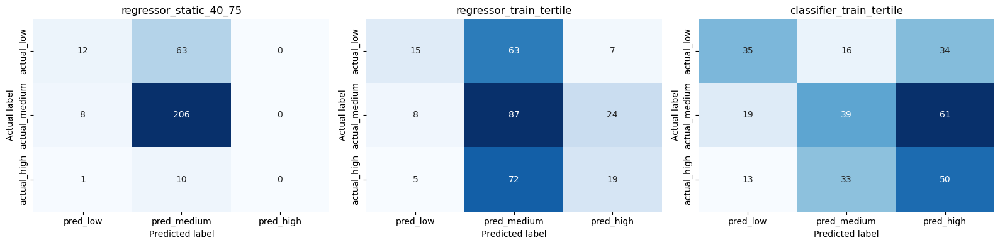

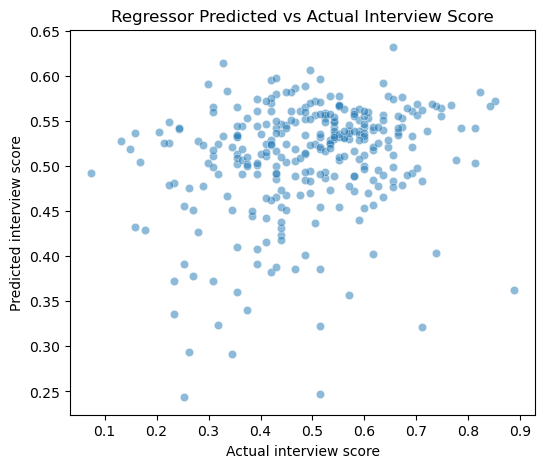

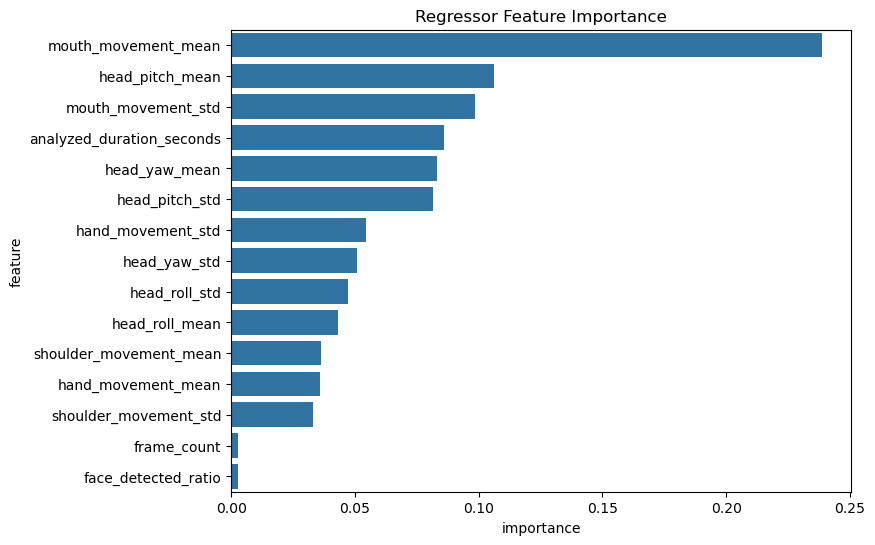

,evaluation,label,precision,recall,f1,support
0,regressor_static_40_75,low,0.571429,0.160000,0.250000,75
1,regressor_static_40_75,medium,0.738351,0.962617,0.835700,214
2,regressor_static_40_75,high,0.000000,0.000000,0.000000,11
3,regressor_train_tertile,low,0.535714,0.176471,0.265487,85
4,regressor_train_tertile,medium,0.391892,0.731092,0.510264,119
5,regressor_train_tertile,high,0.380000,0.197917,0.260274,96
6,classifier_train_tertile,low,0.522388,0.411765,0.460526,85
7,classifier_train_tertile,medium,0.443182,0.327731,0.376812,119
8,classifier_train_tertile,high,0.344828,0.520833,0.414938,96


In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for axis, (title, cm_df) in zip(axes, confusion_matrices.items()):
    matrix = cm_df.drop(columns='evaluation')
    sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues', ax=axis, cbar=False)
    axis.set_title(title)
    axis.set_xlabel('Predicted label')
    axis.set_ylabel('Actual label')
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 5))
sns.scatterplot(x=y_test, y=test_pred, alpha=0.5)
plt.xlabel('Actual interview score')
plt.ylabel('Predicted interview score')
plt.title('Regressor Predicted vs Actual Interview Score')
plt.show()

importances = pd.DataFrame({
    'feature': FEATURE_COLUMNS,
    'importance': best_model.feature_importances_,
}).sort_values('importance', ascending=False)

plt.figure(figsize=(8, 6))
sns.barplot(data=importances, x='importance', y='feature')
plt.title('Regressor Feature Importance')
plt.show()

classification_summary_df


## 13. Export Model


In [17]:
joblib.dump(best_model, MODEL_PATH)

raw_video_suffixes = {'.mp4', '.webm', '.avi', '.mov', '.mkv'}
raw_video_files_remaining = sum(
    1
    for path in RAW_DIR.rglob('*')
    if path.is_file() and path.suffix.lower() in raw_video_suffixes
)

def make_json_safe(value):
    if isinstance(value, dict):
        return {key: make_json_safe(item) for key, item in value.items()}
    if isinstance(value, list):
        return [make_json_safe(item) for item in value]
    if isinstance(value, tuple):
        return [make_json_safe(item) for item in value]
    if isinstance(value, float) and (math.isnan(value) or math.isinf(value)):
        return None
    return value

metrics = {
    'modelName': MODEL_NAME,
    'modelVersion': MODEL_VERSION,
    'dataset': DATASET_ID,
    'annotationSource': ANNOTATION_SOURCE,
    'target': TARGET_NAME,
    'labelSource': LABEL_SOURCE,
    'runMode': RUN_MODE,
    'maxVideosPerSplit': MAX_VIDEOS_PER_SPLIT,
    'deleteVideoAfterExtraction': DELETE_VIDEO_AFTER_EXTRACTION,
    'reuseExistingFeatures': REUSE_EXISTING_FEATURES,
    'splitStrategy': 'stratified 70/15/15 from mirrored ChaLearn train+validation annotations',
    'processedVideoCount': int(len(features_df)),
    'rawVideoFilesRemaining': int(raw_video_files_remaining),
    'rowCounts': {split: int(count) for split, count in features_df.groupby('split').size().items()},
    'labelSourceCounts': {source: int(count) for source, count in features_df['label_source'].value_counts().items()},
    'recommendedOutput': MVP_PRODUCTION_OUTPUT,
    'productionLabelStrategy': PRODUCTION_LABEL_STRATEGY,
    'productionPipeline': 'MediaPipe features -> RandomForestRegressor -> score_0_100 -> LLM',
    'primaryModel': {
        'type': 'RandomForestRegressor',
        'artifact': str(MODEL_PATH),
        'bestConfig': best_config,
    },
    'regression': {
        'validation': validation_regression_metrics,
        'test': test_regression_metrics,
    },
    'validation': {
        'mae': validation_regression_metrics['mae'],
        'meanBaselineMae': validation_regression_metrics['meanBaselineMae'],
    },
    'test': {
        'mae': test_regression_metrics['mae'],
        'rmse': test_regression_metrics['rmse'],
        'r2': test_regression_metrics['r2'],
        'meanBaselineMae': test_regression_metrics['meanBaselineMae'],
        'maeImprovementVsMeanBaseline': test_regression_metrics['maeImprovementVsMeanBaseline'],
    },
    'experimentalLabelEvaluation': {
        'static_40_75': {
            'validation': static_validation_metrics,
            'test': static_test_metrics,
        },
        'train_tertile': {
            'thresholds': label_thresholds,
            'validation': tertile_validation_metrics,
            'test': tertile_test_metrics,
        },
    },
    'classifierExperiment': {
        'purpose': 'Analysis only. Not used by the Intervue MVP inference pipeline.',
        'bestConfig': best_classifier_config,
        'validation': classifier_validation_metrics,
        'test': classifier_test_metrics,
    },
    'modelComparison': model_comparison_df.to_dict(orient='records'),
}

experiment_metrics = {
    'purpose': 'Labeling experiments only; production MVP uses regressor score_0_100.',
    'labelThresholds': label_thresholds,
    'classifierSearchResults': classifier_search_results,
    'modelComparison': model_comparison_df.to_dict(orient='records'),
    'classificationSummary': classification_summary_df.to_dict(orient='records'),
}

feature_schema['recommendedOutput'] = MVP_PRODUCTION_OUTPUT
feature_schema['productionLabelStrategy'] = PRODUCTION_LABEL_STRATEGY
feature_schema['labelThresholdStrategy'] = PRODUCTION_LABEL_STRATEGY
feature_schema['labelThresholds'] = None
feature_schema['classifierExperimentAvailable'] = True
feature_schema['classifierExperimentUsage'] = 'analysis_only_not_mvp_inference'
feature_schema['trainingSummary'] = {
    'bestConfig': best_config,
    'rowCounts': metrics['rowCounts'],
    'validationMae': metrics['regression']['validation']['mae'],
    'testMae': metrics['regression']['test']['mae'],
    'testRmse': metrics['regression']['test']['rmse'],
    'testR2': metrics['regression']['test']['r2'],
    'experimentalStaticMacroF1': metrics['experimentalLabelEvaluation']['static_40_75']['test']['macroF1'],
    'experimentalTertileMacroF1': metrics['experimentalLabelEvaluation']['train_tertile']['test']['macroF1'],
    'classifierExperimentMacroF1': metrics['classifierExperiment']['test']['macroF1'],
}

METRICS_PATH.write_text(json.dumps(make_json_safe(metrics), indent=2), encoding='utf-8')
EXPERIMENT_METRICS_PATH.write_text(json.dumps(make_json_safe(experiment_metrics), indent=2), encoding='utf-8')
SCHEMA_PATH.write_text(json.dumps(make_json_safe(feature_schema), indent=2), encoding='utf-8')

print('Saved model:', MODEL_PATH)
print('Saved schema:', SCHEMA_PATH)
print('Saved metrics:', METRICS_PATH)
print('Saved experiment metrics:', EXPERIMENT_METRICS_PATH)
print('Saved model comparison:', MODEL_COMPARISON_CSV)


Saved model: /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/models/nonverbal_rf.joblib
Saved schema: /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/models/feature_schema.json
Saved metrics: /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/models/metrics.json
Saved experiment metrics: /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/models/experiment_metrics.json
Saved model comparison: /Users/aben/Documents/Kuliah/Semester 6/AI For Business/Intervue/ml/nonverbal/data/processed/model_comparison.csv


## 14. Export Validation


In [18]:
loaded_model = joblib.load(MODEL_PATH)
loaded_schema = json.loads(SCHEMA_PATH.read_text(encoding='utf-8'))
loaded_features = loaded_schema.get('featureOrder', loaded_schema['features'])

validation_sample = test_df.copy()
validation_predictions = clip_raw_predictions(loaded_model.predict(validation_sample[loaded_features]))
actual_values = validation_sample['interview_label'].to_numpy()

validation_sample['predicted_score_0_100'] = np.round(validation_predictions * 100).astype(int)
validation_sample['interview_readiness_proxy_score'] = validation_sample['predicted_score_0_100']
validation_sample['experimental_static_label'] = labels_from_raw(validation_predictions, 'static_40_75')
validation_sample['experimental_tertile_label'] = labels_from_raw(validation_predictions, 'train_tertile', label_thresholds)
validation_sample['experimental_actual_tertile_label'] = labels_from_raw(actual_values, 'train_tertile', label_thresholds)

if not validation_sample['predicted_score_0_100'].between(0, 100).all():
    raise ValueError('Export validation score is outside 0-100 range.')
if validation_sample['predicted_score_0_100'].isna().any():
    raise ValueError('Export validation produced missing scores.')

export_columns = [
    'split',
    'video_id',
    'interview_label',
    'predicted_score_0_100',
    'interview_readiness_proxy_score',
    'experimental_static_label',
    'experimental_tertile_label',
    'experimental_actual_tertile_label',
]
if 'label_source' in validation_sample.columns:
    export_columns.insert(3, 'label_source')

validation_sample[export_columns].to_csv(EXPORT_VALIDATION_CSV, index=False)
validation_sample[export_columns].to_csv(EXPORT_VALIDATION_MODEL_CSV, index=False)
validation_sample[export_columns].head()


,split,video_id,interview_label,label_source,predicted_score_0_100,interview_readiness_proxy_score,experimental_static_label,experimental_tertile_label,experimental_actual_tertile_label
203,test,fTpemcfElxI.005,0.383178,chalearn_annotation_mirror,45,45,medium,medium,low
266,test,rJgbslC72gw.002,0.392523,chalearn_annotation_mirror,57,57,medium,high,low
152,test,Z9GzSxQHKSI.004,0.654206,chalearn_annotation_mirror,50,50,medium,medium,high
9,test,3P_D_bd-_NM.001,0.448598,chalearn_annotation_mirror,47,47,medium,medium,medium
233,test,lnawWqnGpMc.005,0.130841,chalearn_annotation_mirror,53,53,medium,medium,low


## 15. Limitations

- The target label is a proxy from ChaLearn First Impressions V2, not a direct measurement of interview quality.
- The model uses visual features only and does not understand English or Indonesian transcript content.
- The model should not be used to infer real personality, psychological confidence, or emotion.
- The model output is only a supporting signal for feedback, not a hiring decision.
- Webcam quality, lighting, camera angle, and cultural presentation differences can affect visual features.
